In [3]:
## 예제 15.1 패키지 설치 및 환경 준비

# 교과서 호환 버전 고정 및 Plotly 이미지 저장 필수 엔진(kaleido 0.2.1) 설치
!pip install "pyautogen[retrievechat]==0.2.35" yfinance plotly==5.24.1 kaleido==0.2.1 chromadb sentence-transformers pypdf -qqq

## 실행 후 런터임 다시 시작

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
autogen-core 0.7.5 requires opentelemetry-api>=1.34.1, but you have opentelemetry-api 1.27.0 which is incompatible.
autogen-core 0.7.5 requires protobuf~=5.29.3, but you have protobuf 4.25.3 which is incompatible.
google-cloud-spanner 3.66.0 requires protobuf<8.0.0,>=4.25.8, but you have protobuf 4.25.3 which is incompatible.
google-cloud-datastore 2.24.0 requires protobuf<8.0.0,>=4.25.8, but you have protobuf 4.25.3 which is incompatible.
google-cloud-appengine-logging 1.9.0 requires protobuf<8.0.0,>=4.25.8, but you have protobuf 4.25.3 which is incompatible.
google-adk 1.29.0 requires opentelemetry-api<1.39.0,>=1.36.0, but you have opentelemetry-api 1.27.0 which is incompatible.
google-adk 1.29.0 requires opentelemetry-sdk<1.39.0,>=1.36.0, but you have opentelemetry-sdk 1.27.0 which is incompatible.
grpc-google-

In [1]:
## 예제 15.2 OpenAI API 키 설정

import json
import os

# 여기에 본인의 OpenAI API 키를 입력하세요
openai_api_key = os.getenv("OPENAI_API_KEY")

with open('OAI_CONFIG_LIST.json', 'w') as f:
    config_list = [
        {
            "model": "gpt-4o-mini",
            "api_key": openai_api_key,
        },
        {
            "model": "gpt-4o",
            "api_key": openai_api_key,
        },
        {
            "model": "gpt-image-2",  # 최신 최상위 이미지 모델
            "api_key": openai_api_key,
        }
    ]
    json.dump(config_list, f)

In [2]:
## 예제 15.3 에이전트에 사용할 설정 불러오기

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)  # Colab 시스템 경고 무시

import autogen

config_list = autogen.config_list_from_json(
    "OAI_CONFIG_LIST.json",
    file_location=".",
    filter_dict={
        "model": ["gpt-4o-mini"],  # 토큰 에러를 방지하기 위해 가볍고 강력한 gpt-4o-mini 지정
    },
)

llm_config = {
    "config_list": config_list,
    "temperature": 0,
}

In [3]:
## 예제 15.4 AutoGen의 핵심 구성요소인 UserProxyAgent와 AssistantAgent

from autogen import AssistantAgent, UserProxyAgent

# 어시스턴트 시스템 메시지에 소스 코드를 파일로 저장하라는 절대 규칙 추가
assistant = AssistantAgent(
    name="assistant",
    llm_config=llm_config,
    system_message="""You are a world-class Python developer.
When using yfinance, always handle the Multi-Index by using `.squeeze()` to make the 'Close' column 1-dimensional, or select the specific ticker column explicitly to avoid ValueError.
[CRITICAL RULE] You must always start your code block with a filename comment like `# filename: samsung_stock_price.py` so that the user_proxy will automatically save your code as a physical file on the disk.
Write full code blocks enclosed in ```python and ```. Do NOT say 'TERMINATE' on your own until the user_proxy executes your code and returns the result."""
)

# 유저 프록시는 변경 없음
user_proxy = UserProxyAgent(
    name="user_proxy",
    is_termination_msg=lambda x: "TERMINATE" in x.get("content", "") and x.get("content", "").strip().endswith("TERMINATE"),
    human_input_mode="NEVER",
    max_consecutive_auto_reply=3,
    code_execution_config={"work_dir": "coding", "use_docker": False}
)

[autogen.oai.client: 06-05 12:28:16] {164} WARNING - The API key specified is not a valid OpenAI format; it won't work with the OpenAI-hosted model.


In [4]:
# 예제 15.12 실습 준비하기

import os
import re
import time
from typing import Any, Callable, Dict, List, Optional, Tuple, Type, Union

import matplotlib.pyplot as plt
import PIL
import requests
from openai import OpenAI
from PIL import Image

from autogen import Agent, AssistantAgent, ConversableAgent, UserProxyAgent
from autogen.agentchat.contrib.img_utils import _to_pil, get_image_data
from autogen.agentchat.contrib.multimodal_conversable_agent import MultimodalConversableAgent

config_list_4o = autogen.config_list_from_json(
    "OAI_CONFIG_LIST.json",
    filter_dict={
        "model": ["gpt-4o"],
    },
)

config_list_image = autogen.config_list_from_json(
    "OAI_CONFIG_LIST.json",
    filter_dict={
        "model": ["gpt-image-2"],
    },
)

In [5]:
# 예제 15.13 ImageAgent 정의

# Define Image_call to use a supported quality parameter

def Image_call(client, prompt, model="gpt-image-2", size="1024x1024", quality="high", n=1) -> str:
    response = client.images.generate(
        model=model,
        prompt=prompt,
        size=size,
        quality=quality,
        n=n,
    )
    # Debugging: Print the entire response object to see what it contains
    print(f"Image generation API response: {response}")

    image_content = None
    if response.data:
        if response.data[0].url:
            image_content = response.data[0].url
        elif response.data[0].b64_json:
            image_content = response.data[0].b64_json

    if image_content is None:
        print("Error: Image generation failed or returned no usable content (URL or base64).")
        return None # Return None if no content is found

    img_data = get_image_data(image_content) # get_image_data can handle both URL and base64
    return img_data

class ImageAgent(ConversableAgent):
    def __init__(self, name, llm_config: dict, **kwargs):
        super().__init__(name, llm_config=llm_config, **kwargs)

        try:
            config_list = llm_config["config_list"]
            api_key = config_list[0]["api_key"]
        except Exception as e:
            print("Unable to fetch API Key, because", e)
            api_key = os.getenv("OPENAI_API_KEY")
        self.client = OpenAI(api_key=api_key)
        self.register_reply([Agent, None], ImageAgent.generate_Image_reply)

    def generate_Image_reply(self, messages, sender, config):
        print("\n--- generate_Image_reply function called ---") # Debugging print
        client = self.client if config is None else config
        if client is None:
            print("Error: OpenAI client is None in generate_Image_reply.") # Debugging print
            return False, None
        if messages is None:
            messages = self._oai_messages[sender]

        prompt = messages[-1]["content"]
        print(f"Image generation prompt: {prompt}") # Debugging print
        img_data = Image_call(client=self.client, prompt=prompt)

        # Check if img_data is None before trying to display it
        if img_data is None:
            print("Error: img_data is None after Image_call.") # Debugging print
            return True, "Image generation failed. Please check the logs for details." # Return an informative message

        print("Image data successfully obtained. Attempting to display...") # Debugging print
        plt.imshow(_to_pil(img_data))
        plt.axis("off")
        plt.show()
        print("Image display attempt complete.") # Debugging print
        return True, 'result.jpg'

[autogen.oai.client: 06-05 12:28:40] {164} WARNING - The API key specified is not a valid OpenAI format; it won't work with the OpenAI-hosted model.


User_proxy (to Painter):

갈색의 털을 가진 귀여운 강아지를 그려줘

--------------------------------------------------------------------------------

--- generate_Image_reply function called ---
Image generation prompt: 갈색의 털을 가진 귀여운 강아지를 그려줘
Image generation API response: ImagesResponse(created=1780662696, background='opaque', data=[Image(b64_json='iVBORw0KGgoAAAANSUhEUgAABAAAAAQACAIAAADwf7zUAABxn2NhQlgAAHGfanVtYgAAAB5qdW1kYzJwYQARABCAAACqADibcQNjMnBhAAAAcXlqdW1iAAAAR2p1bWRjMm1hABEAEIAAAKoAOJtxA3VybjpjMnBhOjY2NDBiMTZkLTE2OWUtNGM5NC05ZjhhLTY2ZDI2ODBmNDAzNwAAACFVanVtYgAAAClqdW1kYzJhcwARABCAAACqADibcQNjMnBhLmFzc2VydGlvbnMAAAAJ0Wp1bWIAAAA7anVtZEDLDDK7ikidpwsq1vR/Q2kTYzJwYS5pY29uAAAAABhjMnNoOZvNmge7iQjxUIeGkLsYRgAAABdiZmRiAGltYWdlL3N2Zyt4bWwAAAAJd2JpZGI8c3ZnIHdpZHRoPSI3MTYiIGhlaWdodD0iNzE2IiB2aWV3Qm94PSIwIDAgNzE2IDcxNiIgZmlsbD0ibm9uZSIgeG1sbnM9Imh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIj4KPHBhdGggZD0iTTUwOC43NDkgMzE3LjM5OUM1MTYuNzc3IDI4Ny4zMTQgNTA4Ljk5MSAyNTMuODg0IDQ4NS4zODkgMjMwLjI4MkM0NjEuNzg4IDIwNi42ODEgNDI4Lj

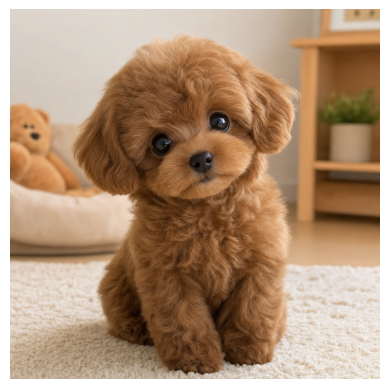

Image display attempt complete.
Painter (to User_proxy):

result.jpg

--------------------------------------------------------------------------------


AttributeError: 'OpenAI' object has no attribute 'total_usage_summary'

In [6]:
# 예제 15.14 이미지 생성 에이전트 실행

painter = ImageAgent(name="Painter", llm_config={"config_list": config_list_image})

user_proxy = UserProxyAgent(
    name="User_proxy", system_message="A human admin.", human_input_mode="NEVER", max_consecutive_auto_reply=0
)

# 이미지 생성 작업 실행하기
user_proxy.initiate_chat(
    painter,
    message="갈색의 털을 가진 귀여운 강아지를 그려줘",
)

In [7]:
# 예제 15.15 이미지를 입력으로 받을 수 있는 GPT-4o 에이전트 생성

image_agent = MultimodalConversableAgent(
    name="image-explainer",
    system_message="Explane input image for painter to create similar image.",
    max_consecutive_auto_reply=10,
    llm_config={"config_list": config_list_4o, "temperature": 0.5, "max_tokens": 1500},
)

user_proxy = autogen.UserProxyAgent(
    name="User_proxy",
    system_message="A human admin.",
    human_input_mode="NEVER",
    max_consecutive_auto_reply=0,
    code_execution_config=False
)

groupchat = autogen.GroupChat(agents=[user_proxy, image_agent, painter], messages=[], max_round=12)
manager = autogen.GroupChatManager(groupchat=groupchat, llm_config=llm_config)

[autogen.oai.client: 06-05 12:31:57] {164} WARNING - The API key specified is not a valid OpenAI format; it won't work with the OpenAI-hosted model.


[autogen.oai.client: 06-05 12:31:57] {164} WARNING - The API key specified is not a valid OpenAI format; it won't work with the OpenAI-hosted model.


User_proxy (to chat_manager):

아래 이미지랑 비슷한 이미지를 만들어줘.
<img https://th.bing.com/th/id/R.422068ce8af4e15b0634fe2540adea7a?rik=y4OcXBE%2fqutDOw&pid=ImgRaw&r=0>.

--------------------------------------------------------------------------------
[autogen.oai.client: 06-05 12:32:31] {164} WARNING - The API key specified is not a valid OpenAI format; it won't work with the OpenAI-hosted model.



Next speaker: image-explainer


>>>>>>>> USING AUTO REPLY...
image-explainer (to chat_manager):

이 이미지는 귀여운 갈색 푸들 강아지가 집 안에 누워 있는 모습입니다. 강아지는 곱슬곱슬한 털을 가지고 있으며, 파란색 목걸이를 하고 있습니다. 배경에는 신발이 놓여 있습니다. 비슷한 이미지를 만들기 위해 다음 요소를 고려하세요:

1. **강아지**: 귀여운 갈색 푸들, 곱슬곱슬한 털.
2. **목걸이**: 파란색 목걸이와 장식.
3. **배경**: 실내 환경, 신발 같은 소품.

이 요소들을 포함하여 유사한 이미지를 그릴 수 있습니다.

--------------------------------------------------------------------------------
[autogen.oai.client: 06-05 12:32:37] {164} WARNING - The API key specified is not a valid OpenAI format; it won't work with the OpenAI-hosted model.



Next speaker: Painter


--- generate_Image_reply function called ---
Image generation prompt: 이 이미지는 귀여운 갈색 푸들 강아지가 집 안에 누워 있는 모습입니다. 강아지는 곱슬곱슬한 털을 가지고 있으며, 파란색 목걸이를 하고 있습니다. 배경에는 신발이 놓여 있습니다. 비슷한 이미지를 만들기 위해 다음 요소를 고려하세요:

1. **강아지**: 귀여운 갈색 푸들, 곱슬곱슬한 털.
2. **목걸이**: 파란색 목걸이와 장식.
3. **배경**: 실내 환경, 신발 같은 소품.

이 요소들을 포함하여 유사한 이미지를 그릴 수 있습니다.
Image generation API response: ImagesResponse(created=1780662937, background='opaque', data=[Image(b64_json='iVBORw0KGgoAAAANSUhEUgAABAAAAAQACAIAAADwf7zUAABhWmNhQlgAAGFaanVtYgAAAB5qdW1kYzJwYQARABCAAACqADibcQNjMnBhAAAAYTRqdW1iAAAAR2p1bWRjMm1hABEAEIAAAKoAOJtxA3VybjpjMnBhOjk0YmJiZDFmLWY4OTMtNGQ0My05NTc3LTJhNDhiNDBhNDg1ZQAAABf9anVtYgAAAClqdW1kYzJhcwARABCAAACqADibcQNjMnBhLmFzc2VydGlvbnMAAAAJ0Wp1bWIAAAA7anVtZEDLDDK7ikidpwsq1vR/Q2kTYzJwYS5pY29uAAAAABhjMnNoBk0Co5bqC10+4rOddFQp+gAAABdiZmRiAGltYWdlL3N2Zyt4bWwAAAAJd2JpZGI8c3ZnIHdpZHRoPSI3MTYiIGhlaWdodD0iNzE2IiB2aWV3Qm94PSIwIDAgNzE2IDcxNiIgZmlsbD0ibm9uZSIgeG1sbnM9Imh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIj4KPHBhdGgg

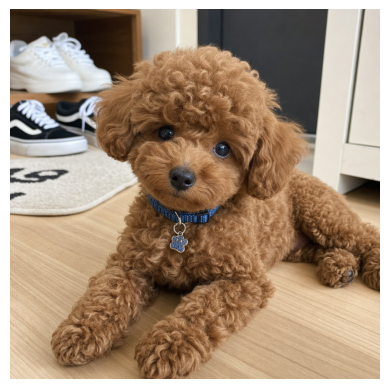

Image display attempt complete.
Painter (to chat_manager):

result.jpg

--------------------------------------------------------------------------------
[autogen.oai.client: 06-05 12:35:38] {164} WARNING - The API key specified is not a valid OpenAI format; it won't work with the OpenAI-hosted model.



Next speaker: User_proxy



ChatResult(chat_id=None, chat_history=[{'content': '아래 이미지랑 비슷한 이미지를 만들어줘.\n<img https://th.bing.com/th/id/R.422068ce8af4e15b0634fe2540adea7a?rik=y4OcXBE%2fqutDOw&pid=ImgRaw&r=0>.', 'role': 'assistant', 'name': 'User_proxy'}, {'content': '이 이미지는 귀여운 갈색 푸들 강아지가 집 안에 누워 있는 모습입니다. 강아지는 곱슬곱슬한 털을 가지고 있으며, 파란색 목걸이를 하고 있습니다. 배경에는 신발이 놓여 있습니다. 비슷한 이미지를 만들기 위해 다음 요소를 고려하세요:\n\n1. **강아지**: 귀여운 갈색 푸들, 곱슬곱슬한 털.\n2. **목걸이**: 파란색 목걸이와 장식.\n3. **배경**: 실내 환경, 신발 같은 소품.\n\n이 요소들을 포함하여 유사한 이미지를 그릴 수 있습니다.', 'name': 'image-explainer', 'role': 'user'}, {'content': 'result.jpg', 'name': 'Painter', 'role': 'user'}], summary='result.jpg', cost={'usage_including_cached_inference': {'total_cost': 0}, 'usage_excluding_cached_inference': {'total_cost': 0}}, human_input=[])

In [8]:
# 예제 15.16 유사한 이미지를 생성하도록 에이전트 실행

user_proxy.initiate_chat(
    manager,
    message=f"""아래 이미지랑 비슷한 이미지를 만들어줘.
<img https://th.bing.com/th/id/R.422068ce8af4e15b0634fe2540adea7a?rik=y4OcXBE%2fqutDOw&pid=ImgRaw&r=0>.""",
)

User_proxy (to chat_manager):

갈색의 털을 가진 귀여운 강아지를 그려줘

--------------------------------------------------------------------------------
[autogen.oai.client: 06-05 12:36:21] {164} WARNING - The API key specified is not a valid OpenAI format; it won't work with the OpenAI-hosted model.



Next speaker: Painter


--- generate_Image_reply function called ---
Image generation prompt: 갈색의 털을 가진 귀여운 강아지를 그려줘
Image generation API response: ImagesResponse(created=1780663155, background='opaque', data=[Image(b64_json='iVBORw0KGgoAAAANSUhEUgAABAAAAAQACAIAAADwf7zUAABxm2NhQlgAAHGbanVtYgAAAB5qdW1kYzJwYQARABCAAACqADibcQNjMnBhAAAAcXVqdW1iAAAAR2p1bWRjMm1hABEAEIAAAKoAOJtxA3VybjpjMnBhOjg4ZWRkMWZkLTA0NTAtNDg0Yy05NzA3LWY2NGEwMzY4ZjU3MAAAACFRanVtYgAAAClqdW1kYzJhcwARABCAAACqADibcQNjMnBhLmFzc2VydGlvbnMAAAAJ0Wp1bWIAAAA7anVtZEDLDDK7ikidpwsq1vR/Q2kTYzJwYS5pY29uAAAAABhjMnNoEpBk0k9Vq7XjTaJwGz3GHQAAABdiZmRiAGltYWdlL3N2Zyt4bWwAAAAJd2JpZGI8c3ZnIHdpZHRoPSI3MTYiIGhlaWdodD0iNzE2IiB2aWV3Qm94PSIwIDAgNzE2IDcxNiIgZmlsbD0ibm9uZSIgeG1sbnM9Imh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIj4KPHBhdGggZD0iTTUwOC43NDkgMzE3LjM5OUM1MTYuNzc3IDI4Ny4zMTQgNTA4Ljk5MSAyNTMuODg0IDQ4NS4zODkgMjMwLjI4MkM0NjEuNzg4IDIwNi42ODEgNDI4LjM2IDE5OC44OTUgMzk4LjI3MyAyMDYuOTIzQzM3Ni4yMzEgMTg0LjkyOCAzNDMuMzkgMTc0Ljk1NiAzMTEuMTQ4IDE4My41OTZDMjc4LjkwN

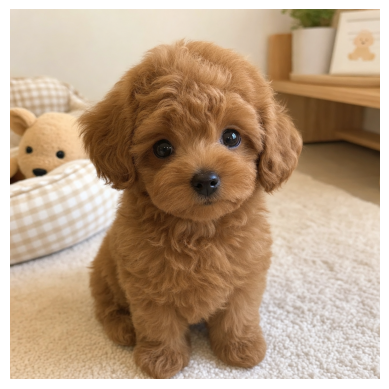

Image display attempt complete.
Painter (to chat_manager):

result.jpg

--------------------------------------------------------------------------------
[autogen.oai.client: 06-05 12:39:16] {164} WARNING - The API key specified is not a valid OpenAI format; it won't work with the OpenAI-hosted model.



Next speaker: image-explainer


>>>>>>>> USING AUTO REPLY...
image-explainer (to chat_manager):

이미지에 묘사된 갈색 털을 가진 귀여운 강아지를 그리기 위해 다음과 같은 요소를 고려하시면 됩니다:

1. **털 색상**: 강아지의 털은 다양한 갈색 톤으로 표현됩니다. 밝은 갈색부터 짙은 갈색까지 다양한 색조를 사용하여 털의 깊이와 질감을 표현하세요.

2. **눈**: 강아지의 눈은 크고 반짝이는 모습으로 그려주세요. 눈동자는 검은색으로, 눈 주위는 조금 더 밝은 색으로 음영을 줘서 입체감을 살리세요.

3. **표정**: 귀여운 표정을 강조하기 위해 눈썹을 살짝 올리거나, 입꼬리를 위로 올려 미소 짓는 모습을 표현할 수 있습니다.

4. **귀**: 강아지의 귀는 부드럽고 털이 풍성하게 묘사됩니다. 귀의 형태와 크기를 다양하게 시도해보세요.

5. **몸의 비율**: 강아지의 몸은 작고 아담한 형태로 그려주세요. 다리는 짧고 통통하게, 꼬리는 약간 구부러진 형태로 표현하면 귀여운 느낌을 줍니다.

6. **배경**: 강아지를 돋보이게 하기 위해 단순한 색상의 배경을 사용하거나, 잔디밭이나 집 안의 따뜻한 분위기를 연출할 수 있습니다.

이러한 요소들을 고려하여 귀여운 갈색 털을 가진 강아지를 그리시면 됩니다. 즐겁게 작업하세요!

--------------------------------------------------------------------------------
[autogen.oai.client: 06-05 12:39:23] {164} WARNING - The API key specified is not a valid OpenAI format; it won't work with the OpenAI-hosted model.



Next speaker: Painter


--- generate_Image_reply function called ---
Image generation prompt: 이미지에 묘사된 갈색 털을 가진 귀여운 강아지를 그리기 위해 다음과 같은 요소를 고려하시면 됩니다:

1. **털 색상**: 강아지의 털은 다양한 갈색 톤으로 표현됩니다. 밝은 갈색부터 짙은 갈색까지 다양한 색조를 사용하여 털의 깊이와 질감을 표현하세요.

2. **눈**: 강아지의 눈은 크고 반짝이는 모습으로 그려주세요. 눈동자는 검은색으로, 눈 주위는 조금 더 밝은 색으로 음영을 줘서 입체감을 살리세요.

3. **표정**: 귀여운 표정을 강조하기 위해 눈썹을 살짝 올리거나, 입꼬리를 위로 올려 미소 짓는 모습을 표현할 수 있습니다.

4. **귀**: 강아지의 귀는 부드럽고 털이 풍성하게 묘사됩니다. 귀의 형태와 크기를 다양하게 시도해보세요.

5. **몸의 비율**: 강아지의 몸은 작고 아담한 형태로 그려주세요. 다리는 짧고 통통하게, 꼬리는 약간 구부러진 형태로 표현하면 귀여운 느낌을 줍니다.

6. **배경**: 강아지를 돋보이게 하기 위해 단순한 색상의 배경을 사용하거나, 잔디밭이나 집 안의 따뜻한 분위기를 연출할 수 있습니다.

이러한 요소들을 고려하여 귀여운 갈색 털을 가진 강아지를 그리시면 됩니다. 즐겁게 작업하세요!
Image generation API response: ImagesResponse(created=1780663360, background='opaque', data=[Image(b64_json='iVBORw0KGgoAAAANSUhEUgAABAAAAAQACAIAAADwf7zUAABxn2NhQlgAAHGfanVtYgAAAB5qdW1kYzJwYQARABCAAACqADibcQNjMnBhAAAAcXlqdW1iAAAAR2p1bWRjMm1hABEAEIAAAKoAOJtxA3VybjpjMnBhOmQ5ZWFkNTE2LTk0ZTgtNDM5Ny1iMzNjLWNjM2IwNzM5YTg2

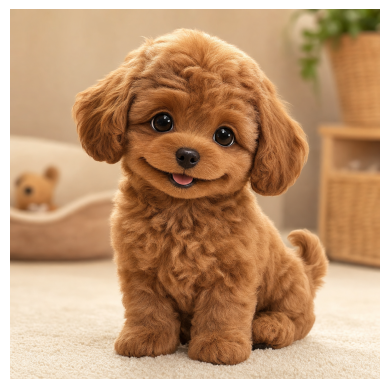

Image display attempt complete.
Painter (to chat_manager):

result.jpg

--------------------------------------------------------------------------------
[autogen.oai.client: 06-05 12:42:41] {164} WARNING - The API key specified is not a valid OpenAI format; it won't work with the OpenAI-hosted model.



Next speaker: image-explainer


>>>>>>>> USING AUTO REPLY...
image-explainer (to chat_manager):

이미지에 묘사된 갈색 털을 가진 귀여운 강아지를 그리기 위해서는 다음과 같은 요소를 고려해 주세요:

1. **털 색상**: 갈색의 다양한 톤을 사용하여 강아지의 털을 자연스럽게 표현하세요. 밝은 갈색부터 짙은 갈색까지 여러 색조를 사용하여 털의 깊이와 질감을 살리세요.

2. **얼굴**: 강아지의 얼굴은 귀여운 표정을 강조합니다. 큰 눈과 작은 코, 그리고 살짝 올라간 입꼬리를 그려서 생동감을 줍니다.

3. **눈**: 반짝이는 큰 눈을 그려주세요. 눈동자는 깊은 색으로, 눈 주위는 밝은 색으로 그려서 눈에 입체감을 줍니다.

4. **귀**: 강아지의 귀는 부드럽고 털이 풍성하게 묘사됩니다. 귀의 모양과 크기를 다양하게 시도해보세요.

5. **몸의 비율**: 강아지의 몸은 작고 통통한 형태로 그려주세요. 특히 다리는 짧고 귀엽게, 꼬리는 약간 말린 형태로 표현하면 좋습니다.

6. **배경**: 강아지가 돋보일 수 있도록 배경은 단순한 색상이나 부드러운 톤으로 표현하세요. 예를 들어 초원이나 실내의 따뜻한 공간을 배경으로 선택할 수 있습니다.

이 요소들을 활용하여 귀여운 갈색 털을 가진 강아지를 그려보세요. 작업을 즐기시길 바랍니다!

--------------------------------------------------------------------------------
[autogen.oai.client: 06-05 12:42:46] {164} WARNING - The API key specified is not a valid OpenAI format; it won't work with the OpenAI-hosted model.



Next speaker: User_proxy



ChatResult(chat_id=None, chat_history=[{'content': '갈색의 털을 가진 귀여운 강아지를 그려줘', 'role': 'assistant', 'name': 'User_proxy'}, {'content': 'result.jpg', 'name': 'Painter', 'role': 'user'}, {'content': '이미지에 묘사된 갈색 털을 가진 귀여운 강아지를 그리기 위해 다음과 같은 요소를 고려하시면 됩니다:\n\n1. **털 색상**: 강아지의 털은 다양한 갈색 톤으로 표현됩니다. 밝은 갈색부터 짙은 갈색까지 다양한 색조를 사용하여 털의 깊이와 질감을 표현하세요.\n\n2. **눈**: 강아지의 눈은 크고 반짝이는 모습으로 그려주세요. 눈동자는 검은색으로, 눈 주위는 조금 더 밝은 색으로 음영을 줘서 입체감을 살리세요.\n\n3. **표정**: 귀여운 표정을 강조하기 위해 눈썹을 살짝 올리거나, 입꼬리를 위로 올려 미소 짓는 모습을 표현할 수 있습니다.\n\n4. **귀**: 강아지의 귀는 부드럽고 털이 풍성하게 묘사됩니다. 귀의 형태와 크기를 다양하게 시도해보세요.\n\n5. **몸의 비율**: 강아지의 몸은 작고 아담한 형태로 그려주세요. 다리는 짧고 통통하게, 꼬리는 약간 구부러진 형태로 표현하면 귀여운 느낌을 줍니다.\n\n6. **배경**: 강아지를 돋보이게 하기 위해 단순한 색상의 배경을 사용하거나, 잔디밭이나 집 안의 따뜻한 분위기를 연출할 수 있습니다.\n\n이러한 요소들을 고려하여 귀여운 갈색 털을 가진 강아지를 그리시면 됩니다. 즐겁게 작업하세요!', 'name': 'image-explainer', 'role': 'user'}, {'content': 'result.jpg', 'name': 'Painter', 'role': 'user'}, {'content': '이미지에 묘사된 갈색 털을 가진 귀여운 강아지를 그리기 위해서는 다음과 같은 요소를 고려해 주세요:\n\n1. **털 색상**: 갈색의 다양한 톤

In [9]:
# 예제 15.18 멀티 모달 에이전트에 텍스트로 명령

user_proxy.initiate_chat(
    manager,
    message="갈색의 털을 가진 귀여운 강아지를 그려줘",
)